#Esto es un membrete


### Contexto del Dataset
El conjunto de datos proporcionado parece contener información sobre la cobertura de redes de telecomunicaciones en Colombia. Esta información es crucial en un país donde la conectividad es un factor determinante para el desarrollo económico, social y tecnológico. La disponibilidad de cobertura de red, ya sea 2G, 3G, 4G, LTE o incluso 5G, es fundamental para garantizar la comunicación efectiva y el acceso a servicios digitales en diversas regiones, desde las áreas urbanas hasta las zonas rurales y remotas. Además, este conjunto de datos probablemente sea utilizado por proveedores de servicios de telecomunicaciones, autoridades gubernamentales y otros actores interesados para monitorear y mejorar la infraestructura de telecomunicaciones en todo el país, buscando reducir la brecha digital y promover la inclusión digital en Colombia.

In [0]:
import pandas as pd
import pyspark
from pyspark import SparkContext
from pyspark.sql import *
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark import SparkFiles
import json
import seaborn as sns
import matplotlib.pyplot as plt

In [0]:
spark = SparkContext.getOrCreate()
spark = SparkSession.builder.appName("Proyecto1").getOrCreate()

sc = SparkContext.getOrCreate()
sql_c = SQLContext(sc)
sc

/databricks/spark/python/pyspark/sql/context.py:118: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


<SparkContext master=local[8] appName=Databricks Shell>

##Descarga de los datos

In [0]:
datasetUno = "https://raw.githubusercontent.com/Aviles17/Tecnologia-SABERPRO/main/data/primera_mitad_cobertura.csv"
datasetDos = "https://raw.githubusercontent.com/Aviles17/Tecnologia-SABERPRO/main/data/segunda_mitad_cobertura.csv"

# Leer los datos en csv
df_uno = pd.read_csv(datasetUno)
df_dos = pd.read_csv(datasetDos, header=None)




## EDA del dataset de Cobertura Movil

In [0]:
# El segundo dataset no tiene los headers correctos así que se los asignaremos
# del primer dataset que si los contiene
df_dos.columns = df_uno.columns

# Unimos ambos dataframes
cobertura_df = pd.concat([df_uno, df_dos], ignore_index=True)

#Convertimos a PySpark
spark_cobertura = sql_c.createDataFrame(cobertura_df) 
display(spark_cobertura)



AÑO,TRIMESTRE,PROVEEDOR,COD DEPARTAMENTO,DEPARTAMENTO,COD MUNICIPIO,MUNICIPIO,CABECERA MUNICIPAL,COD CENTRO POBLADO,CENTRO POBLADO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
2015,4,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73,TOLIMA,73001.0,IBAGUÉ,N,7.3001015E7,EL TOTUMO,S,N,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,68,SANTANDER,68190.0,CIMITARRA,N,6.8190012E7,CAMPO SECO,N,N,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,19,CAUCA,19807.0,TIMBÍO,N,0.0,ANTOMORENO,N,N,N,N,N,N
2015,4,ALMACENES EXITO INVERSIONES S.A.S.,54,NORTE DE SANTANDER,54518.0,PAMPLONA,S,5.4518001E7,PAMPLONA,S,S,S,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,19,CAUCA,19532.0,PATÍA,N,1.9532013E7,EL ESTRECHO,N,N,N,N,N,N
2015,4,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76,VALLE DEL CAUCA,76736.0,SEVILLA,N,7.6736014E7,SAN ANTONIO,N,N,S,N,N,N
2015,4,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANTA CATALINA",88564.0,PROVIDENCIA,N,8.8564002E7,SOUTH WEST BAY,S,S,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,19,CAUCA,19318.0,GUAPI,N,0.0,SANTA CLARA,N,N,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,54,NORTE DE SANTANDER,54498.0,OCAÑA,S,5.4498001E7,OCAÑA,S,S,N,N,N,N
2015,4,COLOMBIA MOVIL S.A ESP,19,CAUCA,19455.0,MIRANDA,S,1.9455001E7,MIRANDA,S,S,S,N,N,N


### Diccionario

In [0]:
spark_cobertura.dtypes

[('AÑO', 'bigint'),
 ('TRIMESTRE', 'bigint'),
 ('PROVEEDOR', 'string'),
 ('COD DEPARTAMENTO', 'bigint'),
 ('DEPARTAMENTO', 'string'),
 ('COD MUNICIPIO', 'double'),
 ('MUNICIPIO', 'string'),
 ('CABECERA MUNICIPAL', 'string'),
 ('COD CENTRO POBLADO', 'double'),
 ('CENTRO POBLADO', 'string'),
 ('COBERTURA 2G', 'string'),
 ('COBERTURA 3G', 'string'),
 ('COBERTURA HSPA+, HSPA+DC', 'string'),
 ('COBERTUTA 4G', 'string'),
 ('COBERTURA LTE', 'string'),
 ('COBERTURA 5G', 'string')]

| Nombre               | Descripción                                                                                         | Tipo de Dato |
|----------------------|-----------------------------------------------------------------------------------------------------|--------------|
| AÑO                  | Año en el que se registraron los datos. Este campo se almacena en formato bigint.                   | bigint       |
| TRIMESTRE            | Trimestre del año en el que se registraron los datos. Este campo se almacena en formato bigint.     | bigint       |
| PROVEEDOR            | Nombre del proveedor de servicios de telecomunicaciones. Este campo se almacena en formato string.  | string       |
| COD DEPARTAMENTO     | Código del departamento al que pertenece el registro. Este campo se almacena en formato bigint.    | bigint       |
| DEPARTAMENTO         | Nombre del departamento al que pertenece el registro. Este campo se almacena en formato string.    | string       |
| COD MUNICIPIO        | Código del municipio al que pertenece el registro. Este campo se almacena en formato double.       | double       |
| MUNICIPIO            | Nombre del municipio al que pertenece el registro. Este campo se almacena en formato string.       | string       |
| CABECERA MUNICIPAL  | Nombre de la cabecera municipal a la que pertenece el registro. Este campo se almacena en formato string. | string |
| COD CENTRO POBLADO  | Código del centro poblado al que pertenece el registro. Este campo se almacena en formato double. | double       |
| CENTRO POBLADO       | Nombre del centro poblado al que pertenece el registro. Este campo se almacena en formato string.  | string       |
| COBERTURA 2G         | Información sobre la cobertura de red 2G en el registro. Este campo se almacena en formato string. | string       |
| COBERTURA 3G         | Información sobre la cobertura de red 3G en el registro. Este campo se almacena en formato string. | string       |
| COBERTURA HSPA+, HSPA+DC | Información sobre la cobertura de red HSPA+, HSPA+DC en el registro. Este campo se almacena en formato string. | string |
| COBERTUTA 4G         | Información sobre la cobertura de red 4G en el registro. Este campo se almacena en formato string. | string       |
| COBERTURA LTE        | Información sobre la cobertura de red LTE en el registro. Este campo se almacena en formato string. | string       |
| COBERTURA 5G         | Información sobre la cobertura de red 5G en el registro. Este campo se almacena en formato string. | string       |


In [0]:
display(spark_cobertura.describe())

summary,AÑO,TRIMESTRE,PROVEEDOR,COD DEPARTAMENTO,DEPARTAMENTO,COD MUNICIPIO,MUNICIPIO,CABECERA MUNICIPAL,COD CENTRO POBLADO,CENTRO POBLADO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
count,407281,407281,407281,407281,407281,407230,407281,407281,407266,407281,407281,407281,407281,407281,407281,407281
mean,2019.0878803577873,2.5027978226335135,null,39.14275401995182,null,39548.582182059276,null,null,3.4014600222856805E7,null,null,null,null,null,null,null
stddev,2.3055941860530016,1.1217579289716373,null,25.736459708452585,null,25713.64319077363,null,null,2.752303051376449E7,null,null,null,null,null,null,null
min,2015,1,ALMACENES EXITO INVERSIONES S.A.S.,5,AMAZONAS,5001.0,ABEJORRAL,N,0.0,20 DE JULIO,N,N,N,N,N,N
max,2023,4,UNE EPM TELECOMUNICACIONES S.A.,99,VICHADA,99773.0,ÚTICA,S,9.9773027E7,ÚTICA,S,S,S,S,S,N


In [0]:
# Se decidió por utilizar los siguientes datos: 

columns_to_drop = ['TRIMESTRE', 'COD DEPARTAMENTO', 'DEPARTAMENTO', 'COD CENTRO POBLADO', 'CENTRO POBLADO', 'CABECERA MUNICIPAL']
spark_cobertura = spark_cobertura.drop(*columns_to_drop)

display(spark_cobertura)

AÑO,PROVEEDOR,COD MUNICIPIO,MUNICIPIO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
2015,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73001.0,IBAGUÉ,S,N,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,68190.0,CIMITARRA,N,N,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,19807.0,TIMBÍO,N,N,N,N,N,N
2015,ALMACENES EXITO INVERSIONES S.A.S.,54518.0,PAMPLONA,S,S,S,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,19532.0,PATÍA,N,N,N,N,N,N
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76736.0,SEVILLA,N,N,S,N,N,N
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88564.0,PROVIDENCIA,S,S,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,19318.0,GUAPI,N,N,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,54498.0,OCAÑA,S,S,N,N,N,N
2015,COLOMBIA MOVIL S.A ESP,19455.0,MIRANDA,S,S,S,N,N,N


### Datos Numericos

In [0]:
from pyspark.sql.functions import isnan, when, count, col

def get_numeric_columns(df):

    numeric_cols = [c for c in df.columns if df.select(c).dtypes[0][1] in ['int', 'float', 'double', "bigint"]]
    return numeric_cols

def show_numeric_columns(df):

    numeric_cols = get_numeric_columns(df)
    
    for col_name in numeric_cols:
        print(f"Columna: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        for row in value_counts:
            print(f"{row[0]}: {row[1]}")
        print()

show_numeric_columns(spark_cobertura)


Columna: AÑO
2015: 13726
2016: 54974
2017: 53974
2018: 52864
2019: 54590
2020: 49883
2021: 48268
2022: 45997
2023: 33005

Columna: COD MUNICIPIO
None: 51
5001.0: 1731
5002.0: 338
5004.0: 108
5021.0: 108
5030.0: 336
5031.0: 228
5034.0: 399
5036.0: 269
5038.0: 119
5040.0: 212
5042.0: 363
5044.0: 230
5045.0: 620
5051.0: 466
5055.0: 86
5059.0: 298
5079.0: 564
5086.0: 234
5088.0: 393
5091.0: 114
5093.0: 230
5101.0: 277
5107.0: 195
5113.0: 210
5120.0: 536
5125.0: 122
5129.0: 596
5134.0: 194
5138.0: 321
5142.0: 224
5145.0: 264
5147.0: 523
5148.0: 331
5150.0: 152
5154.0: 642
5172.0: 266
5190.0: 195
5197.0: 333
5206.0: 115
5209.0: 234
5212.0: 334
5234.0: 404
5237.0: 245
5240.0: 224
5250.0: 379
5264.0: 152
5266.0: 538
5282.0: 451
5284.0: 446
5306.0: 173
5308.0: 426
5310.0: 353
5313.0: 150
5315.0: 220
5318.0: 197
5321.0: 170
5347.0: 245
5353.0: 120
5360.0: 380
5361.0: 359
5364.0: 243
5368.0: 254
5376.0: 307
5380.0: 481
5390.0: 166
5400.0: 260
5411.0: 482
5425.0: 302
5440.0: 169
5467.0: 288
5475.0

Plotting counts for column: AÑO


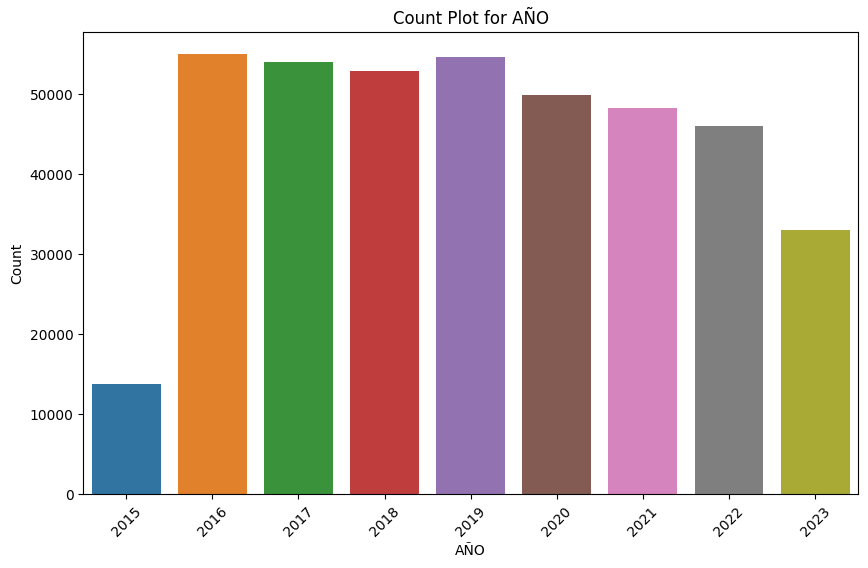

Plotting counts for column: COD MUNICIPIO


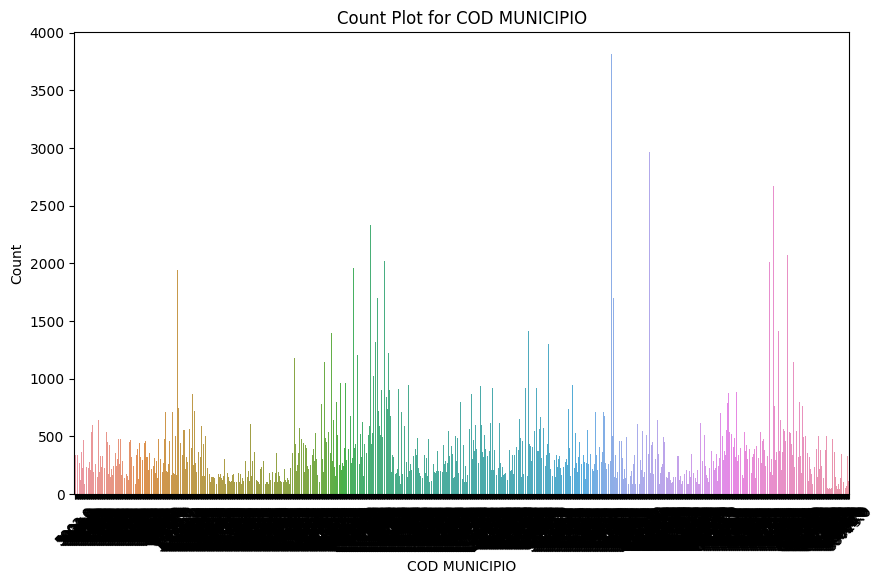

In [0]:
def plot_numeric_columns(df):
    numeric_cols = get_numeric_columns(df)
    
    for col_name in numeric_cols:
        print(f"Plotting counts for column: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
        
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.show()

plot_numeric_columns(spark_cobertura)

In [0]:
# Podemos observar de qué manera la columna "COD CENTROS POBLADOS" cuentas con 55312 valores en 0, 
# lo cual dificultaría demasiado su visualización pues opacaría el resto de datos en una gráfica absoluta.
# Debido a esto, vamos a eliminar estos valores solo para la visualización por ahora.

aux_spark_cobertura = spark_cobertura
spark_cobertura = spark_cobertura.filter(col("COD CENTRO POBLADO") != 0)

# La columna "COD MUNICIPIO", aunque por suerte no cuenta con este problema, igual tiene demasiado datos en el
# el eje X como para poder considerarlos todos. Por esto, tomaremos también solo una cierta mayoría
# significativa en vez del df entero

Plotting counts for column: COD MUNICIPIO


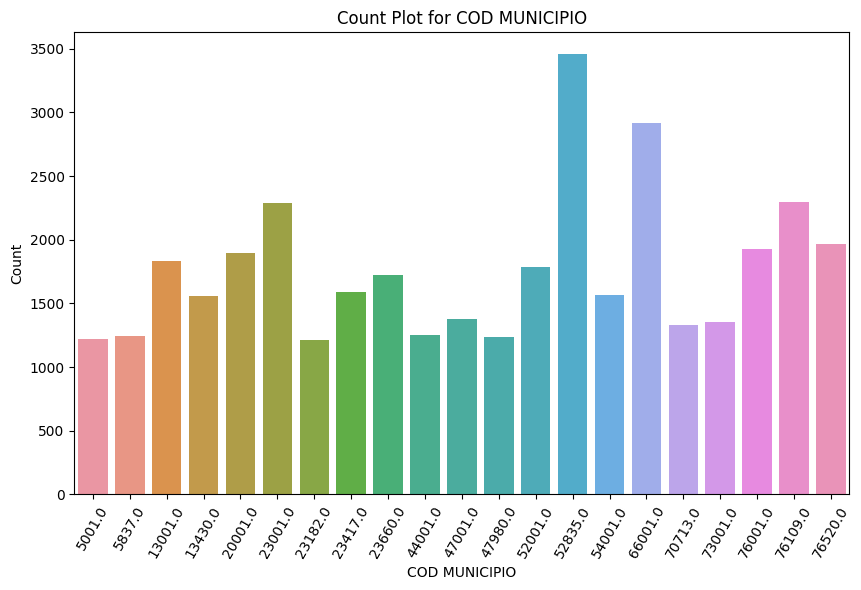

In [0]:
def plot_numeric_column(df, col_name):
    print(f"Plotting counts for column: {col_name}")
    value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).filter(col("count") > 1200).collect()
    counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
    
    if not counts_df.empty:  # Check if counts_df is not empty
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=60)
        plt.show()

# Example usage:
plot_numeric_column(spark_cobertura, "COD MUNICIPIO")


### Datos String

In [0]:
def get_string_columns(df):
    string_cols = [c for c in df.columns if df.select(c).dtypes[0][1] == 'string']
    return string_cols

def show_string_columns(df):
    string_cols = get_string_columns(df)
    
    for col_name in string_cols:
        print(f"Columna: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        for row in value_counts:
            print(f"{row[0]}: {row[1]}")
        print()

show_string_columns(spark_cobertura)

Columna: PROVEEDOR
ALMACENES EXITO INVERSIONES S.A.S.: 4511
AVANTEL S.A.S: 25952
COLOMBIA MOVIL  S.A ESP: 37027
COLOMBIA TELECOMUNICACIONES S.A. E.S.P.: 57274
COMUNICACION CELULAR S A COMCEL S A: 192447
EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP: 20450
PARTNERS TELECOM COLOMBIA SAS: 13546
UNE EPM TELECOMUNICACIONES S.A.: 747

Columna: MUNICIPIO
ABEJORRAL: 230
ABREGO: 190
ABRIAQUÍ: 90
ACACÍAS: 344
ACANDÍ: 284
ACEVEDO: 261
ACHÍ: 638
AGRADO: 194
AGUA DE DIOS: 158
AGUACHICA: 587
AGUADA: 86
AGUADAS: 431
AGUAZUL: 474
AGUSTÍN CODAZZI: 342
AIPE: 322
ALBANIA: 680
ALBÁN: 461
ALCALÁ: 188
ALDANA: 154
ALEJANDRÍA: 108
ALGARROBO: 372
ALGECIRAS: 271
ALMAGUER: 290
ALMEIDA: 106
ALPUJARRA: 194
ALTAMIRA: 196
ALTO BAUDÓ: 657
ALTOS DEL ROSARIO: 228
ALVARADO: 342
AMAGÁ: 318
AMALFI: 174
AMBALEMA: 258
ANAPOIMA: 328
ANCUYA: 112
ANDALUCÍA: 282
ANDES: 399
ANGELÓPOLIS: 215
ANGOSTURA: 116
ANOLAIMA: 290
ANORÍ: 118
ANSERMA: 214
ANSERMANUEVO: 268
ANZA: 194
ANZOÁTEGUI: 255
APARTADÓ: 574
APULO: 157
APÍA: 206
AQUIT

Plotting counts for column: PROVEEDOR


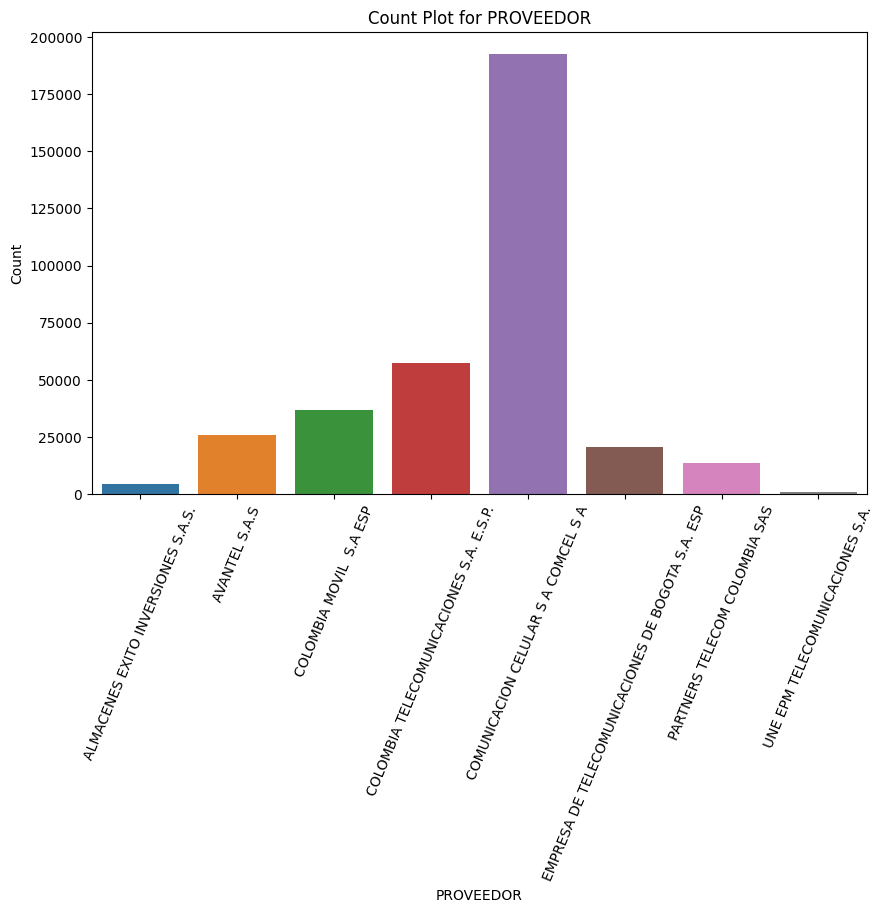

Plotting counts for column: MUNICIPIO


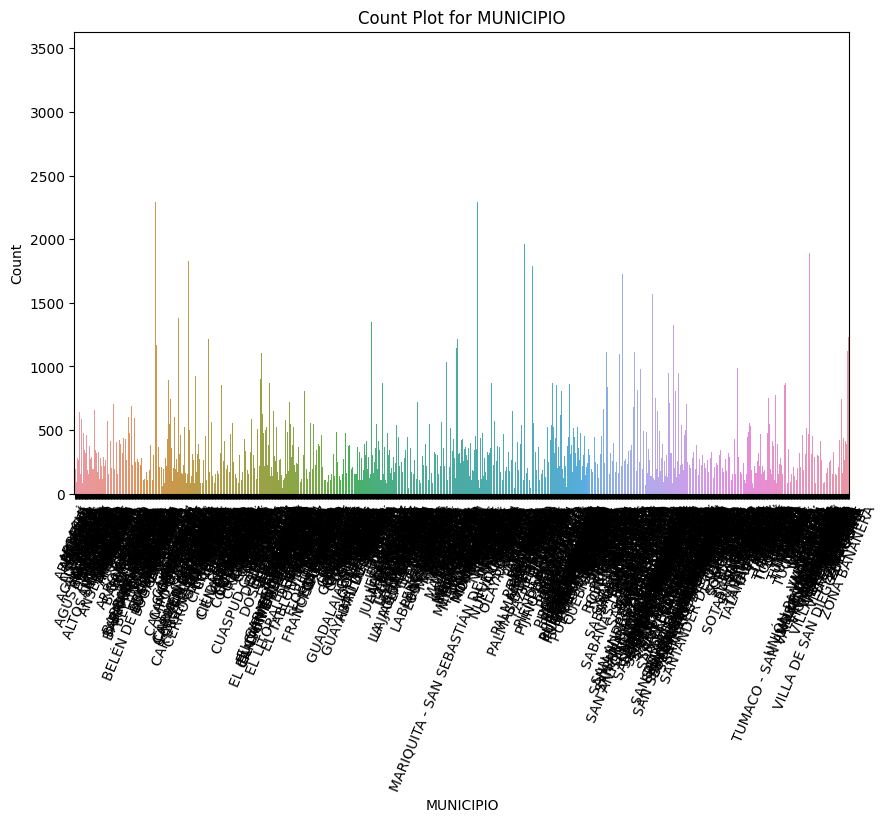

Plotting counts for column: COBERTURA 2G


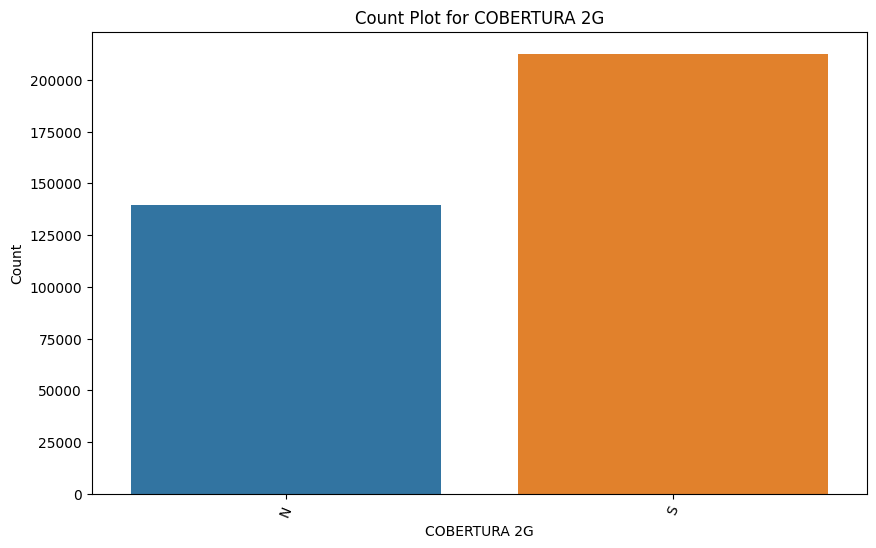

Plotting counts for column: COBERTURA 3G


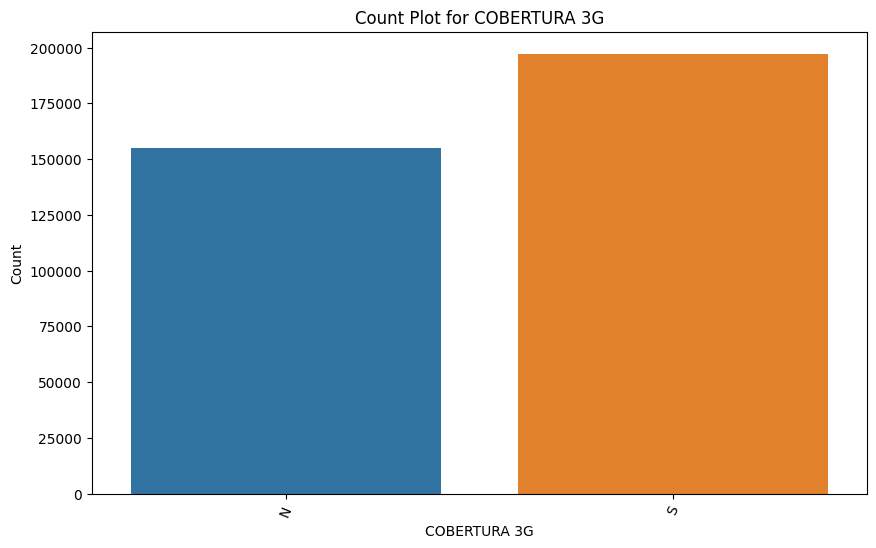

Plotting counts for column: COBERTURA HSPA+, HSPA+DC


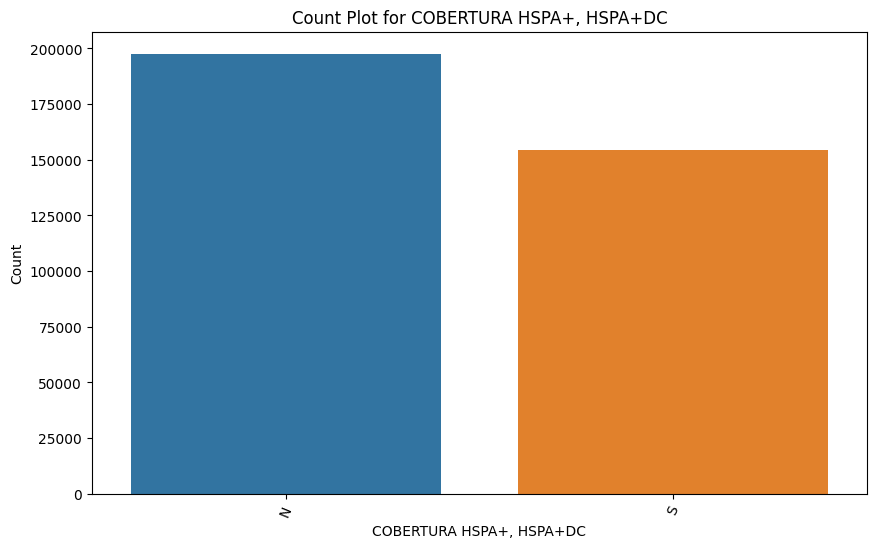

Plotting counts for column: COBERTUTA 4G


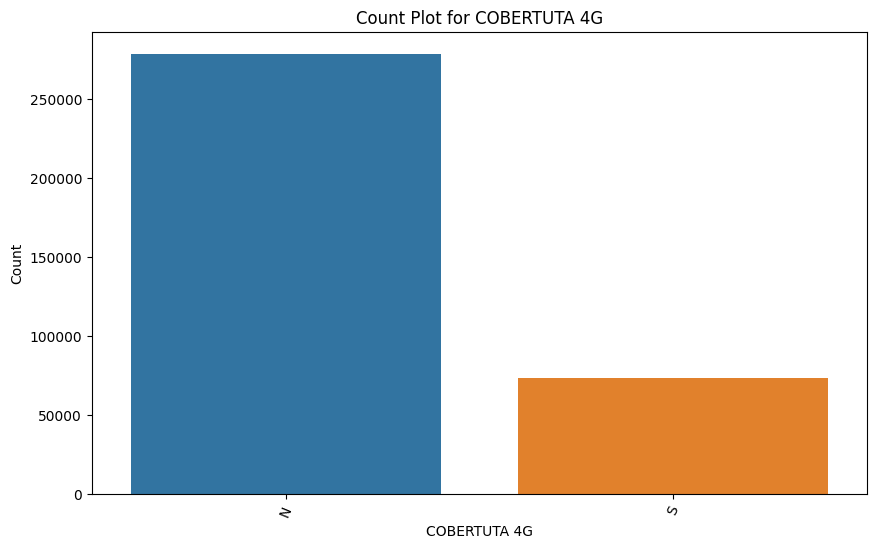

Plotting counts for column: COBERTURA LTE


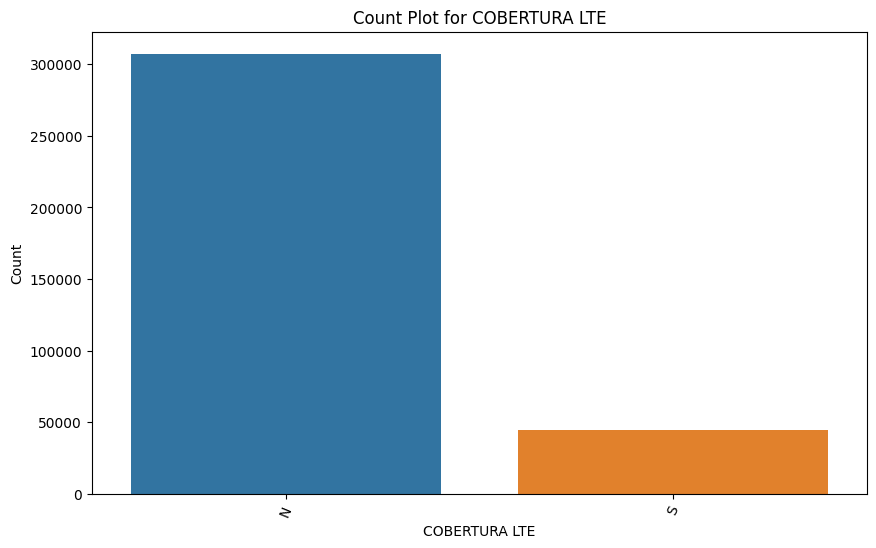

Plotting counts for column: COBERTURA 5G


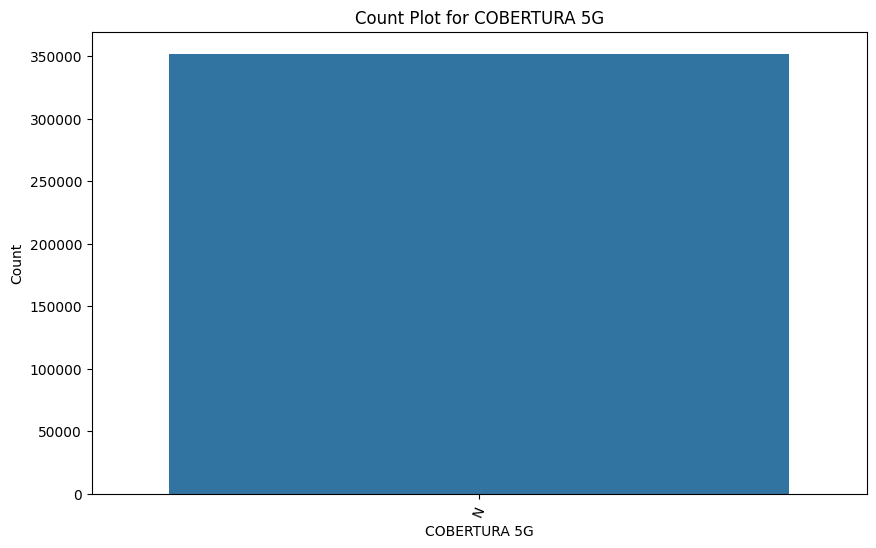

In [0]:
def plot_string_columns(df):
    string_cols = get_string_columns(df)
    for col_name in string_cols:
        print(f"Plotting counts for column: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=67.5)
        plt.show()

# Usage example
plot_string_columns(spark_cobertura)

Plotting counts for column: MUNICIPIO


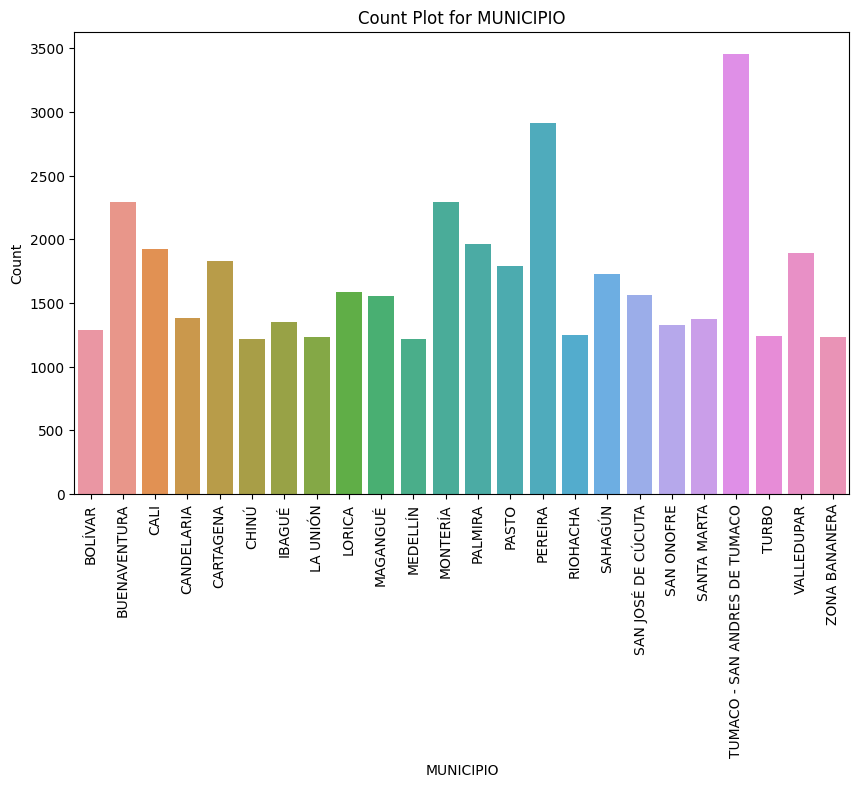

In [0]:
# Igual que como hicimos en la tabla de datos numericos, filtraremos ciertos datos de MUNICIPIOS y CENTROS POBLADOS para poder mostrarlo correctamente.
def plot_numeric_column(df, col_name):
    print(f"Plotting counts for column: {col_name}")
    value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).filter(col("count") > 1200).collect()
    counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
    
    if not counts_df.empty:  # Check if counts_df is not empty
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=89.89)
        plt.show()

# Example usage:
plot_numeric_column(spark_cobertura, "MUNICIPIO")


### Nulos y Redundancia

In [0]:

(spark_cobertura.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in spark_cobertura.columns]).show())

+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|AÑO|PROVEEDOR|COD MUNICIPIO|MUNICIPIO|COBERTURA 2G|COBERTURA 3G|COBERTURA HSPA+, HSPA+DC|COBERTUTA 4G|COBERTURA LTE|COBERTURA 5G|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|  0|        0|            0|        0|           0|           0|                       0|           0|            0|           0|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+



In [0]:
spark_cobertura.select([count(when((col(c) == "None") | (col(c) == 0), c)).alias(c) for c in spark_cobertura.columns]).show()

+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|AÑO|PROVEEDOR|COD MUNICIPIO|MUNICIPIO|COBERTURA 2G|COBERTURA 3G|COBERTURA HSPA+, HSPA+DC|COBERTUTA 4G|COBERTURA LTE|COBERTURA 5G|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|  0|        0|            0|        0|           0|           0|                       0|           0|            0|           0|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+



### Transformación de los datos

In [0]:
# Convertir 'S' a 1 y 'N' a 0 en las columnas especificadas
spark_cobertura = spark_cobertura.withColumn("COBERTURA 2G", when(spark_cobertura["COBERTURA 2G"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA 3G", when(spark_cobertura["COBERTURA 3G"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA HSPA+, HSPA+DC", when(spark_cobertura["COBERTURA HSPA+, HSPA+DC"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTUTA 4G", when(spark_cobertura["COBERTUTA 4G"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA LTE", when(spark_cobertura["COBERTURA LTE"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA 5G", when(spark_cobertura["COBERTURA 5G"] == "S", 1).otherwise(0))


display(spark_cobertura)

AÑO,PROVEEDOR,COD MUNICIPIO,MUNICIPIO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
2015,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73001.0,IBAGUÉ,1,0,0,0,0,0
2015,COMUNICACION CELULAR S A COMCEL S A,68190.0,CIMITARRA,0,0,0,0,0,0
2015,ALMACENES EXITO INVERSIONES S.A.S.,54518.0,PAMPLONA,1,1,1,0,0,0
2015,COMUNICACION CELULAR S A COMCEL S A,19532.0,PATÍA,0,0,0,0,0,0
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76736.0,SEVILLA,0,0,1,0,0,0
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88564.0,PROVIDENCIA,1,1,0,0,0,0
2015,COMUNICACION CELULAR S A COMCEL S A,54498.0,OCAÑA,1,1,0,0,0,0
2015,COLOMBIA MOVIL S.A ESP,19455.0,MIRANDA,1,1,1,0,0,0
2015,COLOMBIA MOVIL S.A ESP,5789.0,TÁMESIS,1,1,1,0,0,0
2015,COLOMBIA MOVIL S.A ESP,5321.0,GUATAPE,1,1,1,0,0,0
